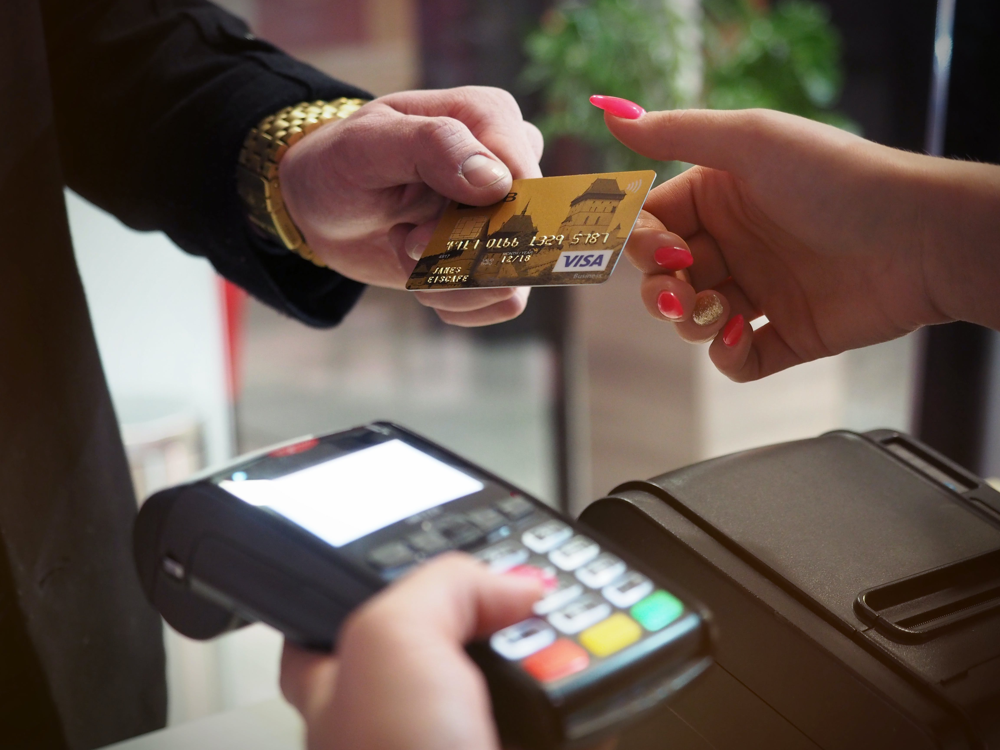

In [1]:
##Importing the image for better presentation
from PIL import Image
img=Image.open('C:/Users/MPALLE/Downloads/Charge paid by people.jpg')
img

In [2]:
#######IMPORTING THE LIBRARIES
!pip install missingno
import missingno as msno
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, cross_val_score
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso



In [3]:
####LOADING THE DATASET
df=pd.read_csv(r"C:/Users/MPALLE/Downloads/charges paid by people/insurance.csv")
df.shape

(1338, 7)

# GATHERING INFORMATION ABOUT THE DATASET


In [4]:
####Checking the top values of the dataframe
df.head()


,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [5]:
#####Getting the description of the DataFrame
df.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


In [6]:
#####Checking the datset
df.head(10)


,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
6,46,female,33.440,1,no,southeast,8240.58960
7,37,female,27.740,3,no,northwest,7281.50560
8,37,male,29.830,2,no,northeast,6406.41070
9,60,female,25.840,0,no,northwest,28923.13692


In [7]:
# Getting the info of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


# HANDLING MISSING VALUES IN THE DATASET

In [8]:
###############CHECKING THE NULL VALUES IN THE COLUMNS##################################
df.isna().sum()
###df.isnull().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

In [9]:
###FINDING THE SUM OF OVERALL NULL VALUES
df.isnull().sum().sum()

0

<Axes: >

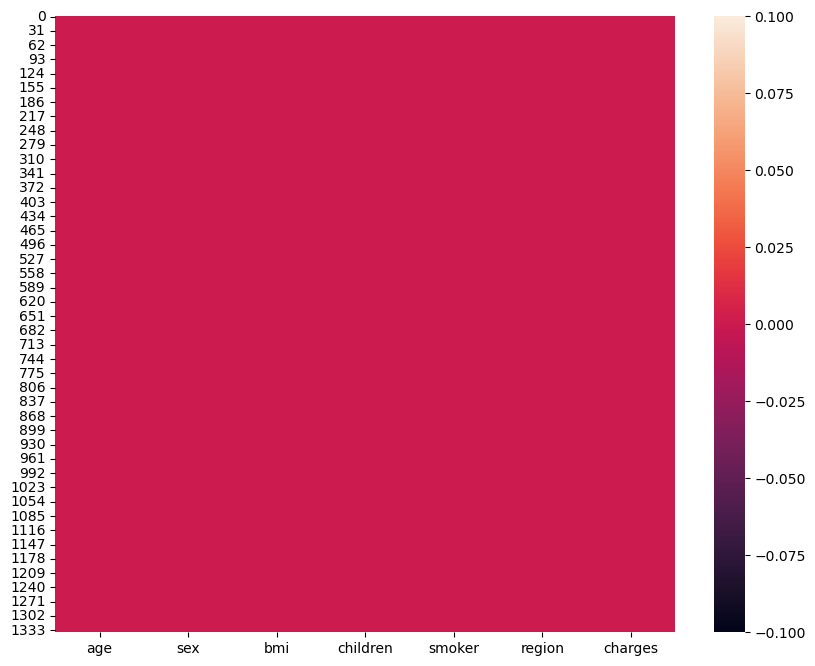

In [10]:
#####VISUALISING THE DATAFRAME USING THE HEATMAP
plt.figure(figsize=(10,8))
sns.heatmap(df.isnull())


<Axes: >

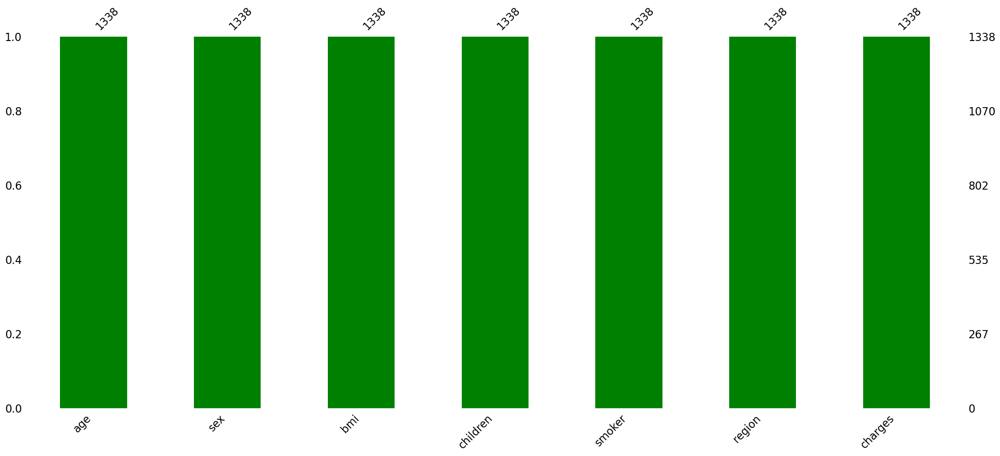

In [11]:
##3THIS BARCHART WILL GIVE AN IDEA ABOUT HOW MANYMISSING VALUES ARE PRESENT IN EACH COLUMN
msno.bar(df,color='green')

In [12]:
d=df.duplicated()
d.head()

0    False
1    False
2    False
3    False
4    False
dtype: bool

In [13]:
##SHOWING THE ROW HAVING DUPLICATE VALUES
print(df[d])

     age   sex    bmi  children smoker     region    charges
581   19  male  30.59         0     no  northwest  1639.5631


In [14]:
###DROPPING THE DUPLICATE VALUES
new_df=df.drop_duplicates()


In [16]:
#######CHECKING THE SHAPE
print("Shape of the new dataset :",new_df.shape)

Shape of the new dataset : (1337, 7)


# we have dropped the duplicate row from the dataset

In [17]:
##Checking the number of unique values in each column
print("NUMBER OF UNIQUE VALUES IN EACH FEATURE")
print(" ")
new_df.nunique()

NUMBER OF UNIQUE VALUES IN EACH FEATURE
 


age           47
sex            2
bmi          548
children       6
smoker         2
region         4
charges     1337
dtype: int64

# HANDLING OUTLIERS

In [18]:
 ###Getting all the numerical categories
num_var = new_df.select_dtypes(include=["int64","float64"]).columns
num_var

Index(['age', 'bmi', 'children', 'charges'], dtype='object')

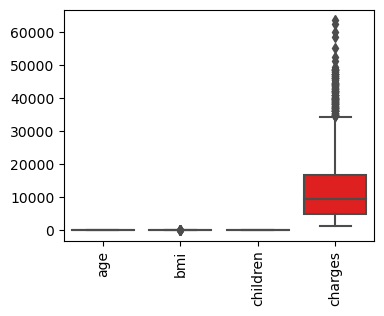

In [19]:
##########VISUALIZING THE WHOLE DATASET TO SELECT THE TARGET VARIABLES

plt.figure(figsize=(4,3))
sns.boxplot(data=new_df,color='red')
plt.xticks(rotation=90)
plt.show()

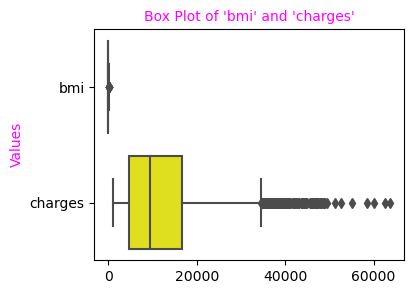

In [20]:
###USING BOXPLOT TO SEE THE OUTLIERS

plt.figure(figsize=(4,3))
sns.boxplot(data=new_df[['bmi','charges']], orient='h',color='yellow')
plt.title("Box Plot of 'bmi' and 'charges'", fontsize=10, color='magenta')
plt.ylabel("Values", fontsize=10, color='magenta')
plt.show()

C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:green'` for same effect.
  warnings.warn(msg, FutureWarning)


<Axes: >

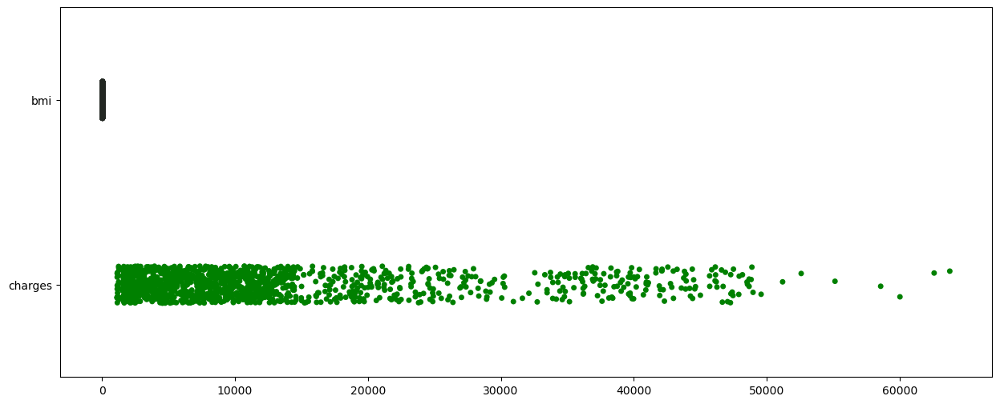

In [21]:
######USING STRIP PLOT TO VISUALIZE THE OUTLIERS

plt.figure(figsize=(15,6))
sns.stripplot(data=new_df[['bmi','charges']],orient='h', color='green',jitter=True,  dodge=False,  legend='auto')

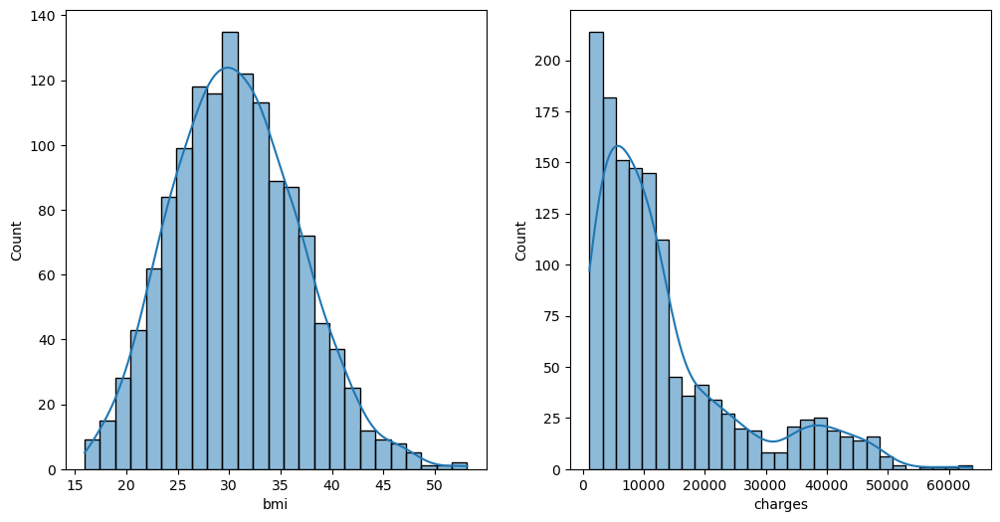

In [22]:
######ANALYSING THE DISTRIBUTION

out_lier=['bmi', 'charges']
plt.figure(figsize=(12,6))
for i, var in enumerate(out_lier):
    plt.subplot(1,2,i+1)
    sns.histplot(data=new_df[var],kde=True)

In [23]:
#####SORTING THE DATAFRAME

new_df['bmi']=sorted(new_df['bmi'])
new_df['charges']=sorted(new_df['charges'])

C:\Users\MPALLE\AppData\Local\Temp\ipykernel_3644\2529506111.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['bmi']=sorted(new_df['bmi'])
C:\Users\MPALLE\AppData\Local\Temp\ipykernel_3644\2529506111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['charges']=sorted(new_df['charges'])


# IQR(interquartile range)

In [24]:
#########CALCULATING 1ST,3RDQUANTILE AND INTERQUANTILE RANGE 
out_lier=['bmi','charges']
for i, var in enumerate(out_lier):
    q1=new_df[var].quantile(0.25)
    q3=new_df[var].quantile(0.75)
    iqr=q3-q1
    
    print("----------------------------------")
    print("25th percentile(q1) value of feature",var,":",q1)
    print("75th percentile(q3) value of feature",var,":",q3)
    print("IQR of feature",var,":",iqr)
    print("----------------------------------")
        

----------------------------------
25th percentile(q1) value of feature bmi : 26.29
75th percentile(q3) value of feature bmi : 34.7
IQR of feature bmi : 8.410000000000004
----------------------------------
----------------------------------
25th percentile(q1) value of feature charges : 4746.344
75th percentile(q3) value of feature charges : 16657.71745
IQR of feature charges : 11911.37345
----------------------------------


In [25]:
#######CALCULATING UPPER AND LOWER LIMITS
out_lier=['bmi','charges']
def limits(feature,q1,q3,iqr):
    upper_limit=q3+(1.5*iqr)
    lower_limit=q1-(1.5*iqr)
    print("upper limit(", feature, ")",":",upper_limit)
    print("lower limit(", feature, ")",":",lower_limit)
    print("----------------------------------")
    print("----------------------------------")
    
    
limits("bmi",26.29,34.7,8.410000000000004)    
limits("charges",4746.344,16657.71745,11911.37345)

upper limit( bmi ) : 47.31500000000001
lower limit( bmi ) : 13.674999999999994
----------------------------------
----------------------------------
upper limit( charges ) : 34524.777625
lower limit( charges ) : -13120.716174999998
----------------------------------
----------------------------------


In [26]:
##########CAPPING- changing the outliers to upper and lower limits
out_lier=['bmi', 'charges']
df_cap=new_df.copy()

def cap_out_lier(var,upper_limit,lower_limit):
    df_cap[var]=np.where(
    df_cap[var]>upper_limit,
    upper_limit,
    np.where(
    df_cap[var]<lower_limit,
    lower_limit,
    df_cap[var]))
    
cap_out_lier("bmi",47.31500000000001,13.674999999999994)
cap_out_lier("charges",34524.777625,-13120.716174999998)    

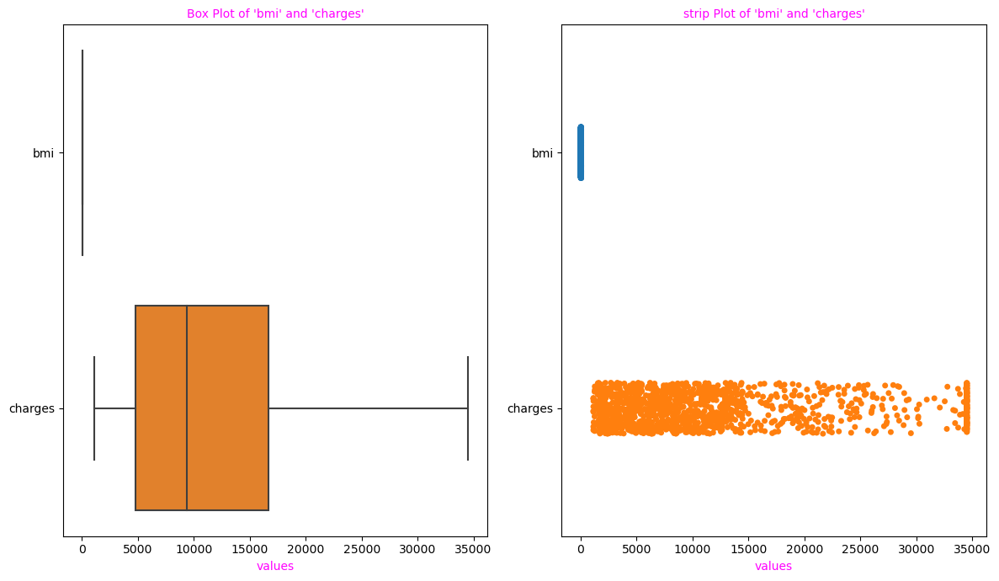

In [27]:
########Checking with the help of stripplot and Boxplot

columns_to_check=['bmi','charges']
plt.figure(figsize=(12,7))

plt.subplot(1,2,1)
sns.boxplot(data=df_cap[columns_to_check],orient='h')
plt.title("Box Plot of 'bmi' and 'charges'", fontsize=10,color='magenta')
plt.xlabel("values",fontsize=10, color='magenta')
plt.subplot(1,2,2)
sns.stripplot(data=df_cap[['bmi','charges']],orient='h',jitter=True)
plt.title("strip Plot of 'bmi' and 'charges'",fontsize=10,color='magenta')
plt.xlabel("values",fontsize=10, color='magenta')

plt.tight_layout()
plt.show()


FROM THE ABOVE BOXPLOT AND THE STRIP PLOT IT IS QUITE EVIDENT THAT THE OUTLIERS ARE HANDLED SUCCESSFULLY

C:\Users\MPALLE\AppData\Local\Temp\ipykernel_3644\2532745556.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(new_df[var],color='magenta', shade=True)
C:\Users\MPALLE\AppData\Local\Temp\ipykernel_3644\2532745556.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_cap[var],color='green', shade=True)
C:\Users\MPALLE\AppData\Local\Temp\ipykernel_3644\2532745556.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(new_df[var],color='magenta', shade=True)
C:\Users\MPALLE\AppData\Local\Temp\ipykernel_3644\2532745556.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become 

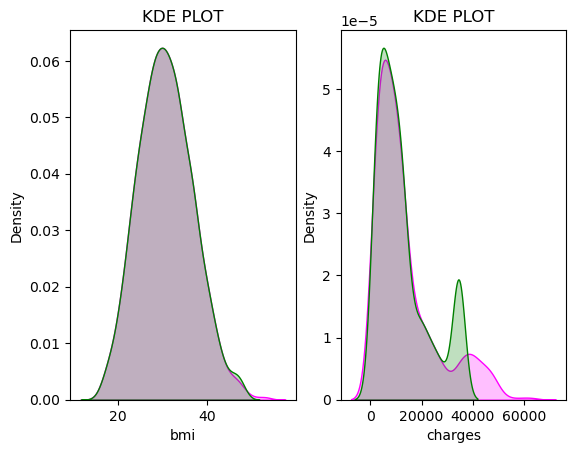

In [28]:
###CHECKING THE DISTRIBUTION BEFORE AND AFTER 

out_lier=['bmi','charges']
for i, var in enumerate(out_lier):
    plt.subplot(1,2,i+1)
    sns.kdeplot(new_df[var],color='magenta', shade=True)
    sns.kdeplot(df_cap[var],color='green', shade=True)
    plt.xlabel(var)
    plt.title('KDE PLOT')

THE DISTRIBUTION OF THE DATA HAS NOT CHANGED THAT MUCH.

# EXPLORATORY DATA ANALYSIS


In [29]:
####CHECKING THE HEAD VALUES
df_cap.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,15.960,0,yes,southwest,1121.8739
1,18,male,16.815,1,no,southeast,1131.5066
2,28,male,16.815,3,no,southeast,1135.9407
3,33,male,17.195,0,no,northwest,1136.3994
4,32,male,17.290,0,no,northwest,1137.0110


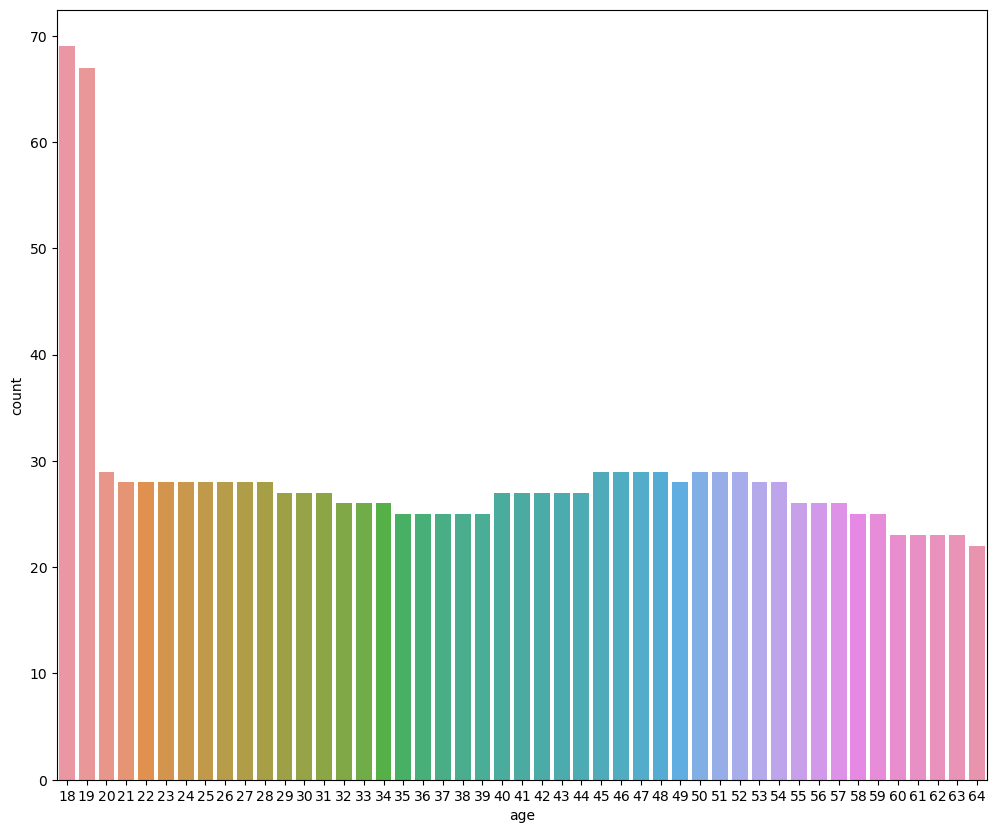

In [30]:
########CHECKING THE WEIGHTAGE OF PEOPLE FROM DIFFERENT AGE GROUP USING COUNTPLOT
plt.figure(figsize=(12,10))
sns.countplot(x='age',data=df_cap)
plt.show()

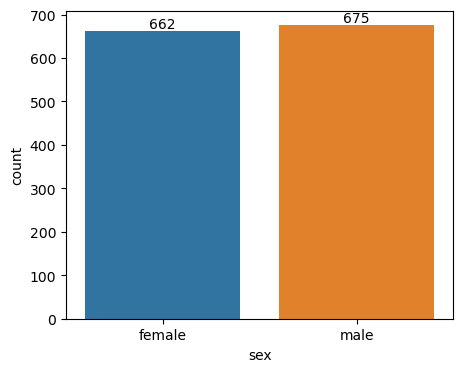

In [31]:
##CHECKING THE COUNT OF MALE AND FEMALE USING THE COUNTPLOT
plt.figure(figsize=(5,4))
ax=sns.countplot(x='sex', data=df_cap)
for bars in ax.containers:
    ax.bar_label(bars)

FROM THE COUNTPLOT IT CAN BE CONCLUDED THAT THE NUMBER OF WOMEN GIVING CHARGES IS ALMOST THE SAME AS THE MEN.

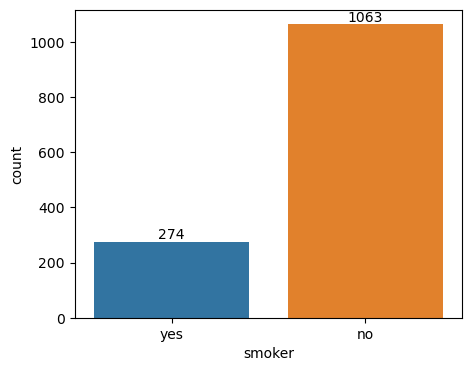

In [32]:
####CHECKING THE WEIGHTAGE OF SMOKERS AND NON SMOKERS
####USING COUNTPLOT

plt.figure(figsize=(5,4))
ax=sns.countplot(x='smoker', data=df_cap)

for bars in ax.containers:
    ax.bar_label(bars)

In [33]:
#####FINDING THE PERCENTAGE
per=274/1063*100
per

25.7761053621825

FROM THE ABOVE TWO CELLS OF CODE WE CAN COME TO CONCLUSION THAT THERE ARE VERY LESS NUMBER OF PEOPLE WHO SMOKE. THE PERCENTAGE
OF PEOPLE WHO SMOKE IS CLOSE TO 26%

THERE ARE LESER NUMBER OF PEOPLE WHO SMOKE AS COMPARED TO THOSE WHO SMOKE

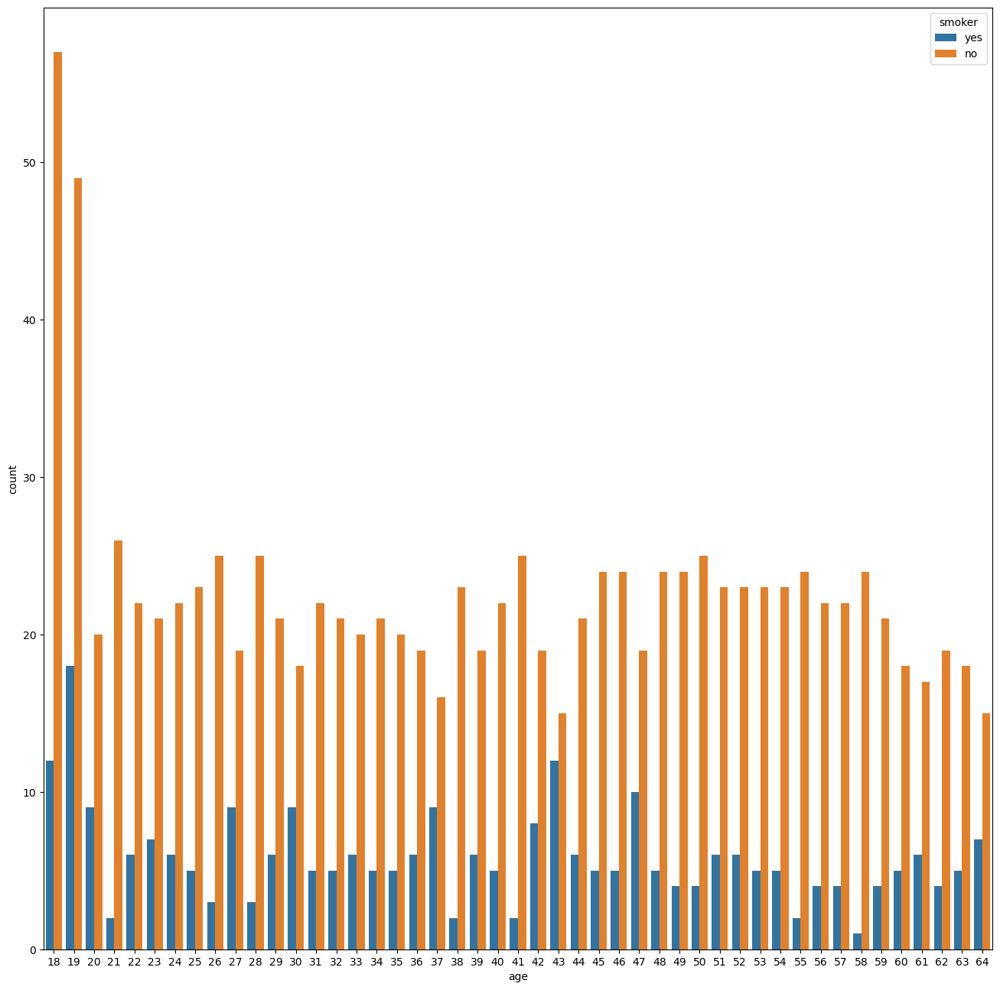

In [34]:
#########FINDING THE RELATION BETWEEN "SMOKER AND "AGE" FEATURE

plt.figure(figsize=(16,16))
ax=sns.countplot(x='age',data=df_cap, hue='smoker')

FROM THE GRAPH IT IS CLEAR THAT IN EACH AGE GROUP, THE NUMBER OF PEOPLE WHO SMOKE LESS. ALSO , PEOPLE WHO SMOKE THE MOST BELONGS
TO AGE GROUP OF(18-19)

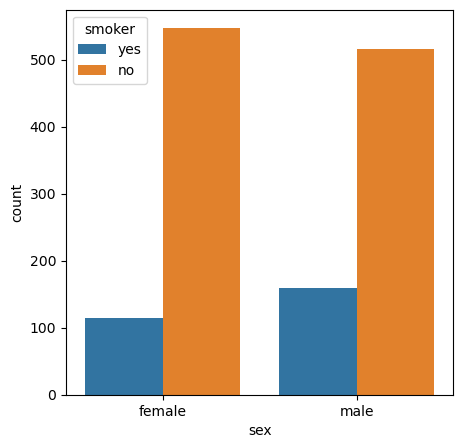

In [35]:
plt.figure(figsize=(5,5))
ax=sns.countplot(x='sex',data=df_cap,hue='smoker')

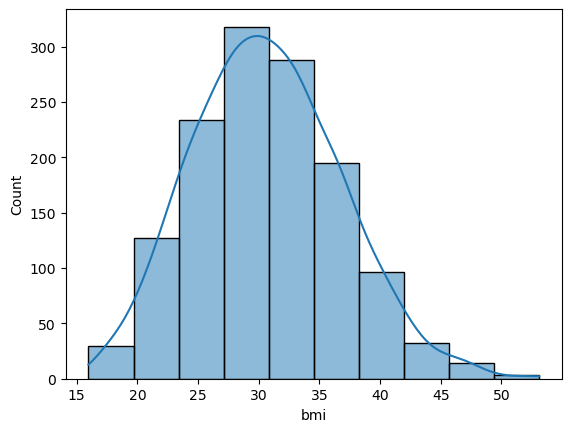

In [36]:
####CHECKING THE DISTRIBUTION OF THE "BMI" FEATURE
sns.histplot(new_df['bmi'], kde=True, bins=10, )
plt.show()

<Axes: xlabel='children', ylabel='count'>

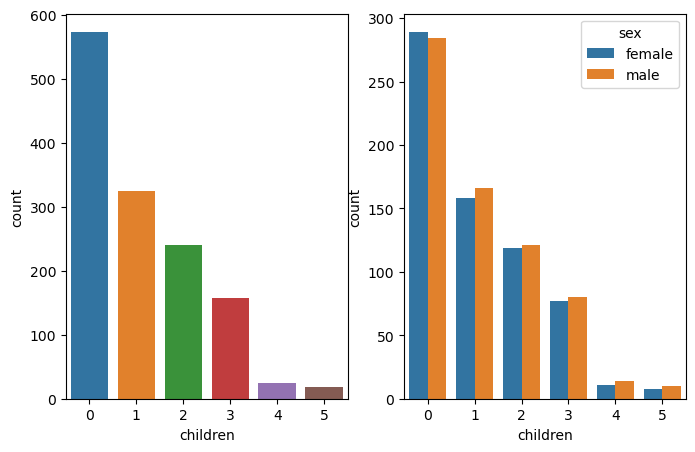

In [37]:
plt.figure(figsize=(8,5))
plt.subplot(1,2,1)
sns.countplot(x='children', data=df_cap)
plt.subplot(1,2,2)
sns.countplot(x='children', data=df_cap, hue='sex')


In [38]:
df_cap['region'].value_counts()


southeast    364
southwest    325
northwest    324
northeast    324
Name: region, dtype: int64

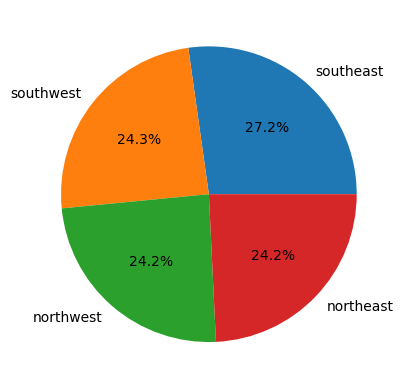

In [39]:
a=[364,325,324,324]
b=['southeast','southwest','northwest','northeast']
plt.pie(a,labels=b, autopct="%1.1f%%")
plt.show()

FROM THE ABOVE GRAPH IT CAN BE CONCLUDED THAT MOST OF THE PEOPLE WHO PAY CHARGES ARE FROM 'southeast' FOLLOWED BY 'southwest'.MOREOVER, THE NUMBER OF PEOPLE BELONGING TO 'northwest' AND 'northeast' IS EXACTLY THE SAME.

In [40]:
df_cap.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,15.960,0,yes,southwest,1121.8739
1,18,male,16.815,1,no,southeast,1131.5066
2,28,male,16.815,3,no,southeast,1135.9407
3,33,male,17.195,0,no,northwest,1136.3994
4,32,male,17.290,0,no,northwest,1137.0110


# FINDING PATTERNS BETWEEN INDEPENDENT AND DEPENDENT FEATURES

<Axes: xlabel='charges', ylabel='Count'>

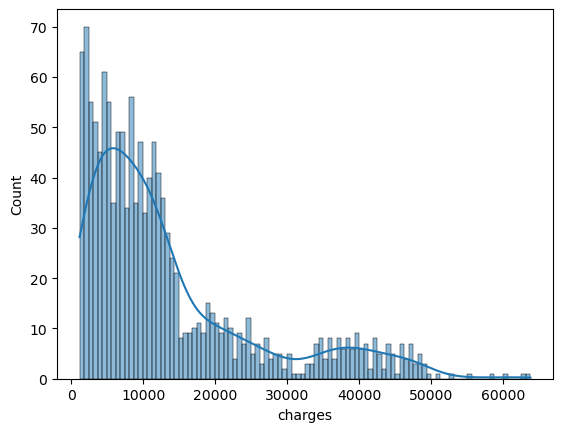

In [41]:
sns.histplot(new_df['charges'], kde=True, bins=100)


In [42]:
new_df['charges'].describe()

count     1337.000000
mean     13279.121487
std      12110.359656
min       1121.873900
25%       4746.344000
50%       9386.161300
75%      16657.717450
max      63770.428010
Name: charges, dtype: float64

MOST NUMBER OF PEOPLE HAVE GIVEN 1337 UNITS OF MONEY.THE AVERAGE OF ALL THE CHARGES COME OUT TO BE 13279.121487 UNITS

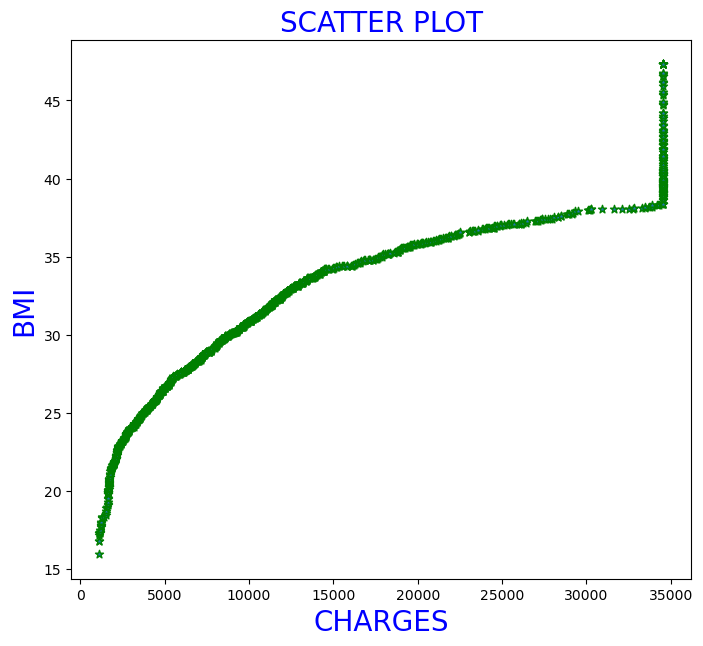

In [43]:
plt.figure(figsize=(8,7))
plt.scatter(df_cap['charges'],df_cap['bmi'], marker='*',edgecolors='g')
plt.title("SCATTER PLOT", fontsize=20,color='blue')
plt.xlabel("CHARGES", fontsize=20,color='blue')
plt.ylabel("BMI", fontsize=20,color='blue')
plt.show()

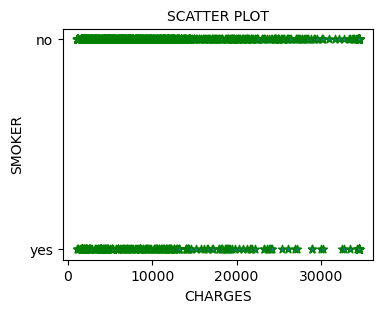

In [44]:
plt.figure(figsize=(4,3))
plt.scatter(df_cap['charges'],df_cap['smoker'], marker='*',edgecolors='g')
plt.title("SCATTER PLOT", fontsize=10,color='k')
plt.xlabel("CHARGES", fontsize=10,color='k')
plt.ylabel("SMOKER", fontsize=10,color='k')
plt.show()

# ENCODING (CATEGORICAL TO NUMERICAL)

In [45]:
########LISTING OUT THE CATEGORICAL FEATURES

cat_var=df_cap.select_dtypes(include=['O']).keys()
cat_var

Index(['sex', 'smoker', 'region'], dtype='object')

In [46]:
##DROPPING THE REGION FEATURE
#####MAKING THE NEW DATAFRAME HAVING ONLY REGION FEATURE

new_df=df_cap.drop(columns='region')
df=df_cap[['region']]
new_df.head()

,age,sex,bmi,children,smoker,charges
0,19,female,15.960,0,yes,1121.8739
1,18,male,16.815,1,no,1131.5066
2,28,male,16.815,3,no,1135.9407
3,33,male,17.195,0,no,1136.3994
4,32,male,17.290,0,no,1137.0110


In [47]:
#######ONE HOT ENCODING THE VARIABLES

new_df=pd.get_dummies(new_df, drop_first=True)
new_df.head()

,age,bmi,children,charges,sex_male,smoker_yes
0,19,15.960,0,1121.8739,0,1
1,18,16.815,1,1131.5066,1,0
2,28,16.815,3,1135.9407,1,0
3,33,17.195,0,1136.3994,1,0
4,32,17.290,0,1137.0110,1,0


In [48]:
#####LABEL ENCODING THE REGION FEATURE
le=LabelEncoder()
le.fit_transform(df['region'])


array([3, 2, 2, ..., 2, 3, 1])

In [49]:
####CONVERTING THE ARRAY INTO DATAFRAME

df['region_L_enc']=le.fit_transform(df['region'])
df.head()

C:\Users\MPALLE\AppData\Local\Temp\ipykernel_3644\2248120538.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['region_L_enc']=le.fit_transform(df['region'])


,region,region_L_enc
0,southwest,3
1,southeast,2
2,southeast,2
3,northwest,1
4,northwest,1


In [50]:
#####MERGING THE TWO DATASETS
merged_df=pd.concat([new_df, df], axis=1)
merged_df.head()


,age,bmi,children,charges,sex_male,smoker_yes,region,region_L_enc
0,19,15.960,0,1121.8739,0,1,southwest,3
1,18,16.815,1,1131.5066,1,0,southeast,2
2,28,16.815,3,1135.9407,1,0,southeast,2
3,33,17.195,0,1136.3994,1,0,northwest,1
4,32,17.290,0,1137.0110,1,0,northwest,1


In [51]:
#####DROPPING THE REGION FEATURE FROM merged_df

df=merged_df.drop(columns='region')
df.head()

,age,bmi,children,charges,sex_male,smoker_yes,region_L_enc
0,19,15.960,0,1121.8739,0,1,3
1,18,16.815,1,1131.5066,1,0,2
2,28,16.815,3,1135.9407,1,0,2
3,33,17.195,0,1136.3994,1,0,1
4,32,17.290,0,1137.0110,1,0,1


In [52]:
########CHECKING THE DATATYPES

df.dtypes

age               int64
bmi             float64
children          int64
charges         float64
sex_male          uint8
smoker_yes        uint8
region_L_enc      int32
dtype: object

# SPLITTING


In [53]:
######SPLITTING INTO X MATRIX AND Y VECTOR
x=df.drop(columns=['charges'],axis=1)
y=df[['charges']]

In [54]:
#########CHECKING THE FEATURES IN X MATRIX
x.columns.values

array(['age', 'bmi', 'children', 'sex_male', 'smoker_yes', 'region_L_enc'],
      dtype=object)

In [55]:
#########PRINTING THE SHAPE OF THE (X-MATRIX) AND (Y-VECTOR)

print("shape of x:", x.shape)
print("shape of y:", y.shape)

shape of x: (1337, 6)
shape of y: (1337, 1)


In [56]:
#########SPLITTING THE DATA IN TRAIN AND TEST
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=None)

print('Shape of x_train:', x_train.shape)
print('Shape of x_test:', x_test.shape)
print('Shape of y_train:', y_train.shape)
print('Shape of y_test:', y_test.shape)

Shape of x_train: (1069, 6)
Shape of x_test: (268, 6)
Shape of y_train: (1069, 1)
Shape of y_test: (268, 1)


# FEATURE SELECTION

In [57]:
#####GETTING THE CORRELATION MATRIX
cor=x_train.corr()
cor

,age,bmi,children,sex_male,smoker_yes,region_L_enc
age,1.000000,-0.022443,0.053643,-0.023284,-0.021002,-0.017914
bmi,-0.022443,1.000000,0.032602,0.004260,0.020650,0.005983
children,0.053643,0.032602,1.000000,0.014104,-0.006597,0.028703
sex_male,-0.023284,0.004260,0.014104,1.000000,0.067046,0.015889
smoker_yes,-0.021002,0.020650,-0.006597,0.067046,1.000000,0.035853
region_L_enc,-0.017914,0.005983,0.028703,0.015889,0.035853,1.000000


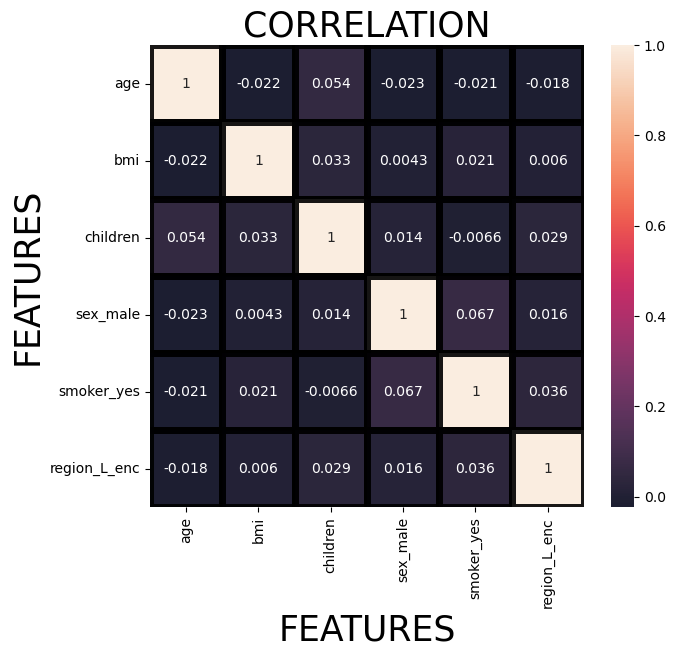

In [58]:
#############GETTING THE CORRELATION OF ALL THE FEATURES EXCEPT THE TARGET FEATURE

plt.figure(figsize=(7,6))
sns.heatmap(cor,annot=True,linewidth=5,linecolor='k',alpha=0.9,cbar_kws={"shrink":1})
plt.title("CORRELATION",fontsize=25,color='k')
plt.xlabel("FEATURES",fontsize=25,color='k')
plt.ylabel("FEATURES",fontsize=25,color='k')
plt.show()


In [59]:
#### With the following function we can select highly correlated features 
#it will remove the first feature that is correlated to any other feature

def correlation(dataset, threshold):
    col_corr=set()
    corr_matrix=dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if(corr_matrix.iloc[i,j])> threshold:
                colname=corr_matrix.columns[i]#########getting the name of column
                col_corr.add(colname)
    return col_corr

drop_feature=correlation(x_train, 0.8)
drop_feature

set()

In [60]:
########## determine the mutual information
mutual_info=mutual_info_regression(x_train,y_train)
mutual_info


C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0.        , 4.46923117, 0.        , 0.        , 0.        ,
       0.        ])

In [61]:
####GETTING THE MUTUAL INFORMATION IN DESCENDING ORDER

mutual_info=pd.Series(mutual_info)
mutual_info.index=x_train.columns
mutual_info.sort_values(ascending=False)


bmi             4.469231
age             0.000000
children        0.000000
sex_male        0.000000
smoker_yes      0.000000
region_L_enc    0.000000
dtype: float64

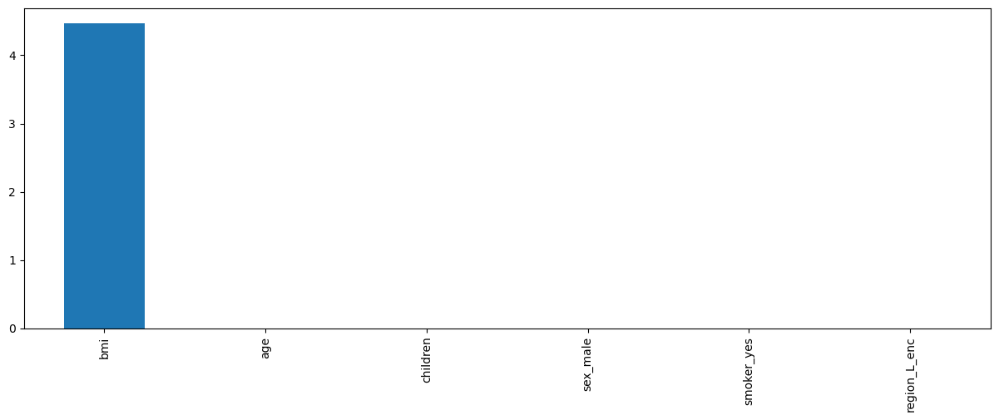

In [62]:
###VISUALISATION WITH THE HELP OF PLOT#######
mutual_info.sort_values(ascending=False).plot.bar(figsize=(15,5))
plt.show()

In [63]:
######SELECTING THE TOP 20 PERCENTILE
selected_top_columns=SelectPercentile(mutual_info_regression,percentile=20)
selected_top_columns.fit(x_train,y_train)

C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SelectPercentile(percentile=20,
                 score_func=<function mutual_info_regression at 0x0000027FEA11DEE0>)

In [64]:
########DISPLAYING WHETHER THE FEATURE IS SELECTED OR NOT IN THE FORM OF TRUE OR FALSE
selected_top_columns.get_support()

array([False,  True, False, False, False, False])

In [65]:
############DISPLAYING THE NAME OF THE SELECTED FEATURE
x_train.columns[selected_top_columns.get_support()]

Index(['bmi'], dtype='object')

In [66]:
######HACING ONLY THE FEATURE IN THE DATASETS

x_train=x_train[['bmi']]
x_test=x_test[['bmi']]



In [67]:
##############CHECKING THE HEAD VALUES
x_train.head()


,bmi
1121,36.850
1146,37.100
196,24.130
1066,35.815
1300,42.750


In [68]:
###########CHECKING THE HEAD VALUES
x_test.head()

,bmi
797,31.920
171,23.655
752,31.350
166,23.650
175,23.750


# FEATURE SCALING

In [69]:
#####CREATING OBJECT
sc=StandardScaler()
sc.fit(x_train)

StandardScaler()

In [70]:
#############TRANSFORMING THE DATASETS
x_train_sc=sc.transform(x_train)
x_test_sc=sc.transform(x_test)

In [71]:
############CONVERTING THE ARRAY INTO THE DATAFRAME
x_train_sc=pd.DataFrame(x_train_sc,columns=['bmi'])
x_test_sc=pd.DataFrame(x_test_sc,columns=['bmi'])


In [72]:
# CHECKING THE DESCRIPTION OF THE DATAFRAME

x_train_sc.describe().round(2)

,bmi
count,1069.00
mean,-0.00
std,1.00
min,-2.43
25%,-0.70
50%,-0.06
75%,0.65
max,2.78


# MODEL TRAINING

# DECISION TREE

In [73]:
######TRAINING THE MODEL

dt= DecisionTreeRegressor(criterion='squared_error')
dt.fit(x_train,y_train)

DecisionTreeRegressor()

In [74]:
###########PRINTING THE SCORE 
#######CROSS VALIDATING


print("score:",dt.score(x_test, y_test))
print(" ")
cross_dt = cross_val_score(dt, x_train,y_train, cv=10)
print("cross_validation: ", cross_dt.mean())

score: 0.9998822870818518
 
cross_validation:  0.9998935143805954


In [75]:
############FINDING MEAN SQUARED ERROR
############FINDING RMSE

y_pred_dt= dt.predict(x_test)
mse_dt=mean_squared_error(y_test,y_pred_dt)
rmse_dt=np.sqrt(mse_dt)
print("mse_dt",mse_dt)
print("rmse_dt",rmse_dt)

mse_dt 12736.753185823998
rmse_dt 112.85722478345814


# RANDOM FOREST

In [76]:
######TRAINING THE MODEL

rf=RandomForestRegressor()
rf.fit(x_train,y_train)

C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestRegressor()

In [77]:
# PRINTING THE SCORE
########CROSS VALIDATING
print("score", rf.score(x_test,y_test))
print("------------------------------------------------------------")
cross_rf=cross_val_score(rf,x_train,y_train,cv=10)
print("cross_validation",cross_rf.mean())


score 0.9998916772237996
------------------------------------------------------------


C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was

cross_validation 0.9998911746057116


In [78]:
############FINDING MEAN SQUARED ERROR
############FINDING RMSE

y_pred_rf= rf.predict(x_test)
mse_rf=mean_squared_error(y_test,y_pred_rf)
rmse_rf=np.sqrt(mse_rf)
print("mse_rf",mse_rf)
print("rmse_rf",rmse_rf)

mse_rf 11720.722640918106
rmse_rf 108.26228632777948


# K-NEAREST NEIGHBOUR(KNN)


In [79]:
#########TRAINING THE MODEL

knn=KNeighborsRegressor(n_neighbors=3)
knn.fit(x_train_sc,y_train)


KNeighborsRegressor(n_neighbors=3)

In [80]:
# PRINTING THE SCORE
########CROSS VALIDATING
print("score", knn.score(x_test_sc,y_test))
print("------------------------------------------------------------")
cross=cross_val_score(knn,x_train_sc,y_train,cv=10)
print("cross_validation",cross.mean())

score 0.9999004847852848
------------------------------------------------------------
cross_validation 0.9998556569720181


In [81]:
###########FINDING MEAN SQUARED ERROR
##########FINDING RMSE

y_pred=knn.predict(x_test_sc)
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("mse:", mse)
print("rmse:", rmse)

mse: 10767.728368315984
rmse: 103.7676653313352


# SUPPORT VECTOR REGRESSOR

In [82]:
#######RBF KERNEL
#######Training the model

svr_rbf=SVR(kernel='rbf')
svr_rbf.fit(x_train_sc, y_train)

C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR()

In [83]:
########Printing the score
#########CROSS VALIDATING

print("score", svr_rbf.score(x_test, y_test))
cross_sv_rbf=cross_val_score(svr_rbf,x_train_sc, y_train, cv=10)
print("cross_validation", cross_sv_rbf.mean())

score -0.11428442493882596


C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d arr

cross_validation -0.06701074078459628


In [84]:
######FINDING THE MEAN SQUARED ERROR
####FINDING THE RMSE
y_pred=svr_rbf.predict(x_test_sc)
mse=mean_squared_error(y_test,y_pred)
rmse=np.sqrt(mse)
print("mse:", mse)
print("rmse:", rmse)

mse: 116677741.2978796
rmse: 10801.74714098972


# LINEAR KERNEL

In [85]:
####LINEAR KERNEL
####MODEL TRAINING

svr_linear=SVR(kernel='linear')
svr_linear.fit(x_train_sc,y_train)

C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(kernel='linear')

In [86]:
##########PRINTING THE SCORE
##########CROSS VALIDATING

print("score", svr_linear.score(x_test_sc,y_test))
cross= cross_val_score(svr_linear,x_train_sc,y_train,cv=10)
print("cross_calidation", cross.mean())

score 0.04370201575959687


C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d arr

cross_calidation 0.038570759502164896


In [87]:
#########FINDING MEAN SQUARED ERROR
#########FINDING RMSE

y_pred=svr_linear.predict(x_test_sc)
mse=mean_squared_error(y_test,y_pred)
rmse=np.sqrt(mse)
print("mse:", mse)
print("rmse:", rmse)

mse: 103473192.1439443
rmse: 10172.17735511647


# POLYNOMIAL KERNEL
######MODEL TRAINING


In [88]:
# POLYNOMIAL KERNEL
######MODEL TRAINING
svr_poly=SVR(kernel='poly',degree=2)
svr_poly.fit(x_train_sc,y_train)


C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(degree=2, kernel='poly')

In [89]:
####PRINTING THE SCORE
#####CROSS VALIDATING

print("score", svr_poly.score(x_test_sc,y_test))
cross=cross_val_score(svr_poly,x_train_sc,y_train, cv=10)
print("cross_validation", cross.mean())

score -0.10404131952929307


C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d arr

cross_validation -0.09358152048216137


C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\MPALLE\AppData\Local\anaconda1\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d arr

In [90]:
#########FINDING THE MEAN SQUARED ERROR
#########FINDING RMSE

y_pred=svr_poly.predict(x_test_sc)
mse=mean_squared_error(y_test,y_pred)
rmse=np.sqrt(mse)
print("mse:",mse)
print("rmse:", rmse)

mse: 119459291.42708509
rmse: 10929.743429151715


# RIDGE AND LASSO REGRESSION

In [91]:
#####RIDGE REGRESSION
#####MODEL TRAINING

rd=Ridge()
rd.fit(x_train_sc,y_train)


Ridge()

In [92]:
##########PRINTING  THE SCORE
##########CROSS VALIDATING

print("score", rd.score(x_test_sc,y_test))
print("  ")
cross=cross_val_score(rd,x_train_sc,y_train,cv=10)
print("cross_validation",cross.mean())

score 0.8896931609111236
  
cross_validation 0.8718164581212082


In [93]:
#####FINDING MEAN SQUARED ERROR
#######FINDING RMSE

y_pred=rd.predict(x_test_sc)
mse=mean_squared_error(y_test,y_pred)
rmse=np.sqrt(mse)
print("mse:",mse)
print("rmse:",rmse)

mse: 11935401.876749273
rmse: 3454.765097188125


# LASSO REGRESSION

In [94]:
#####LASSO REGRESSION
#####MODEL TRAINING

ls=Lasso()
ls.fit(x_train_sc,y_train)


Lasso()

In [95]:
#######PRINTING THE SCORE
#######CROSS VALIDATING

print("score",ls.score(x_test_sc,y_test))
print("  ")
cross=cross_val_score(ls,x_train_sc,y_train, cv=10)
print("cross_validation", cross.mean())

score 0.8896995320088588
  
cross_validation 0.8718130463826721


In [96]:
############FINDING THE MEAN SQUARED ERROR
############FINDING RMSE

y_pred=ls.predict(x_test_sc)
mse=mean_squared_error(y_test,y_pred)
rmse=np.sqrt(mse)
print("mse:",mse)
print("rmse:",rmse)

mse: 11934712.512313725
rmse: 3454.665325659452


# CONCLUSION: